<a href="https://colab.research.google.com/github/darylsilva/is-it-a-bear/blob/main/Working_copy_of_is_it_a_Bear%3Fipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from fastai.vision.all import *

In [ ]:
import fastai

In [ ]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 70.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 16.1.0 which is i

In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
import os
iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')
!pip install -Uqq --verbose duckduckgo_search
if iskaggle:
	!pip install -U duckduckgo_search

	!pip install -Uqq fastai
	!pip install fastbook
	!pip install -Uqq fastai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.0/145.0 kB 12.6 MB/s eta 0:00:00


In [ ]:
import os
from fastdownload import download_url
dest = 'bear.jpg'
print (os.environ.get('KAGGLE_KERNEL_RUN_TYPE', ''))

In [ ]:
print(dest)


bear.jpg


In [ ]:
#from duckduckgo_search import ddg_images
from duckduckgo_search import DDGS
from fastcore.all import *
ddgs = DDGS()
def search_images(term, max_images=3):
    print(f"Searching for '{term}'")
    #return L(ddgs.images(term, max_results=max_images)).itemgot('image')
    return L(ddgs.images(keywords=term, max_results=max_images)).itemgot('image')

In [ ]:
urls = search_images('bear photos', max_images=1)
urls[0]

Searching for 'bear photos'


'https://images.pexels.com/photos/162340/bear-bavarian-bear-wild-brown-bear-162340.jpeg?cs=srgb&dl=animal-bear-cute-162340.jpg&fm=jpg'

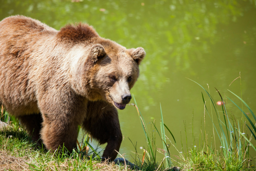

In [ ]:
dest = 'bear.jpg'

download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

Searching for 'forest photos'


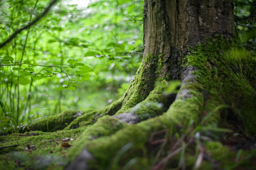

In [ ]:
download_url(search_images('forest photos', max_images=1)[0], 'forest.jpg', show_progress=False)
Image.open('forest.jpg').to_thumb(256,256)

In [ ]:
searches = 'forest','bear'
pathName = 'bear_or_not2'
path = Path(pathName)
from time import sleep

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} photos',max_images=50))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} sun photos',max_images=50))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} dark photos',max_images=50))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

Searching for 'forest photos'
Searching for 'forest sun photos'
Searching for 'forest dark photos'
Searching for 'bear photos'
Searching for 'bear sun photos'
Searching for 'bear dark photos'


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
print(f'{len(failed)} images found with issues in folder {path}')

3 images found with issues in folder bear_or_not2


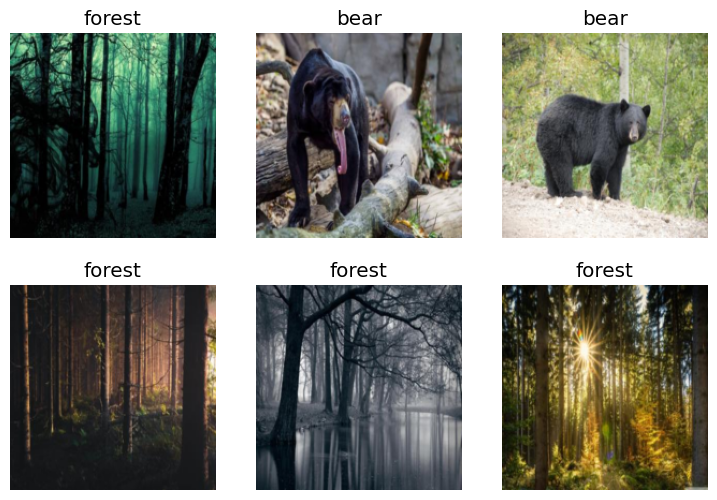

In [ ]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

dls.show_batch(max_n=6)

Running learing model


In [ ]:
learn = vision_learner(dls, resnet50, metrics=error_rate)
learn.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 138MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.578682,0.007334,0.000000,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.086377,0.011961,0.000000,00:02
1,0.087390,0.002429,0.000000,00:02
2,0.058028,0.004277,0.000000,00:02
3,0.041962,0.005834,0.000000,00:02
4,0.035734,0.008521,0.000000,00:02


In [ ]:
is_bear,_,probs = learn.predict(PILImage.create('bear.jpg'))
print(f"This is a: {is_bear}.")
print(f"Probability it's a bear: {probs[0]:.4f}")

This is a: bear.
Probability it's a bear: 1.0000


Ok now we have a BEAR!!


In [ ]:
path = Path('bears')
bear_types = ['black', 'grizzly', 'teddy']

In [ ]:
ims = search_images_ddg('bear animal')
len(ims)

200

In [ ]:
dest = 'images/bear.jpg'
download_url(ims[0],dest)

Path('images/bear.jpg')

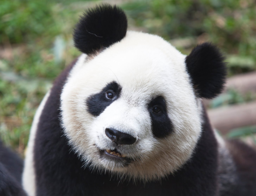

In [ ]:
im = Image.open(dest)
im.to_thumb(256,256)

In [ ]:
urls = search_images_ddg('bear photos', max_images=1)
urls[0]

'https://s.hdnux.com/photos/01/32/07/32/23623324/3/1200x0.jpg'

In [ ]:
animals = 'black bear', 'grizzly bear', 'polar bear '
path = Path('animals')

In [ ]:
if not path.exists():
    path.mkdir()
    for bear in bear_types:
        dest = (path/bear)
        dest.mkdir(exist_ok=True, parents=True)
        urls = search_images_ddg(f'{bear} bear photos', max_images=50)

        # Debug: Check the URLs returned
        print(f'Found {len(urls)} URLs for {bear} bears.')
        print(urls)

        download_images(dest, urls=urls)

        # Debug: Check if images are downloaded
        downloaded_files = list(dest.iterdir())
        print(f'Downloaded {len(downloaded_files)} images for {bear} bears.')
        print(downloaded_files)

        time.sleep(10)  # Sleep to avoid too many requests in a short time

Found 50 URLs for black bears.
['https://images.fineartamerica.com/images/artworkimages/mediumlarge/1/7-maine-black-bear-sharon-fiedler.jpg', 'https://cottagelife.com/wp-content/uploads/2017/07/shutterstock_503744119.jpg', 'http://www.oregonzoo.org/sites/default/files/gallery/images/V_orig_pete_wave_black_bear_gal.jpg', 'https://wallpapercave.com/wp/wp3102528.jpg', 'https://wallpaperaccess.com/full/1220014.jpg', 'https://www.rockymountainnationalpark.com/images/xl/20180605-15-17-41-lg.jpg', 'http://www.publicdomainpictures.net/pictures/100000/velka/black-bear-14060013468Fu.jpg', 'http://www.all-creatures.org/aw/images/blackbear-072.jpg', 'http://static1.squarespace.com/static/52097095e4b0cc1763c79dbf/t/53d2c650e4b0c3fee1f4e66b/1406322299520/black-bear.jpg', 'https://live.staticflickr.com/7625/16389571734_ee4ce7c8c0_b.jpg', 'http://media.massal.net/austin-zoo/l/american-black-bear-closeup-austin-zoo-100801-p.jpg', 'https://grizzlybearwatching.com/wp-content/uploads/2017/03/BlackBear1.jp

In [ ]:
fns = get_image_files(path)
fns

(#139) [Path('animals/black/80a3b8cf-6d79-473c-a00d-1fc96ec65f28.jpg'),Path('animals/black/babe1830-5342-43b1-ad3e-3a9443d23645.jpg'),Path('animals/black/09baf75e-7aee-41ce-8daf-b4770cdfaad3.jpg'),Path('animals/black/d2039712-66b0-470a-a989-1f9920f1e02e.jpg'),Path('animals/black/fe75e420-2c4d-4b59-9038-ca964faa7395.jpg'),Path('animals/black/fdfa3733-8705-469b-a393-e8974f0258ee.JPG'),Path('animals/black/eaa7a8d6-de6c-4839-8d78-fd63e982d48a.jpg'),Path('animals/black/23e89f5b-2222-4561-a2d8-3e52795611f1.jpg'),Path('animals/black/1bebe06b-83c9-4fac-b19e-620740aa7c14.jpg'),Path('animals/black/551996a4-7ad0-41d2-ac13-744df9155692.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#2) [Path('animals/teddy/bdd76331-1b97-468c-897b-38375a8d736a.jpg'),Path('animals/grizzly/aa750fc2-f76b-4873-b7c6-686318d77f5f.JPG')]

In [ ]:
failed.map(Path.unlink)

(#2) [None,None]

In [ ]:
animals = DataBlock(
    blocks = (ImageBlock,CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed = 42),
    get_y = parent_label,
    item_tfms = Resize(128)
)

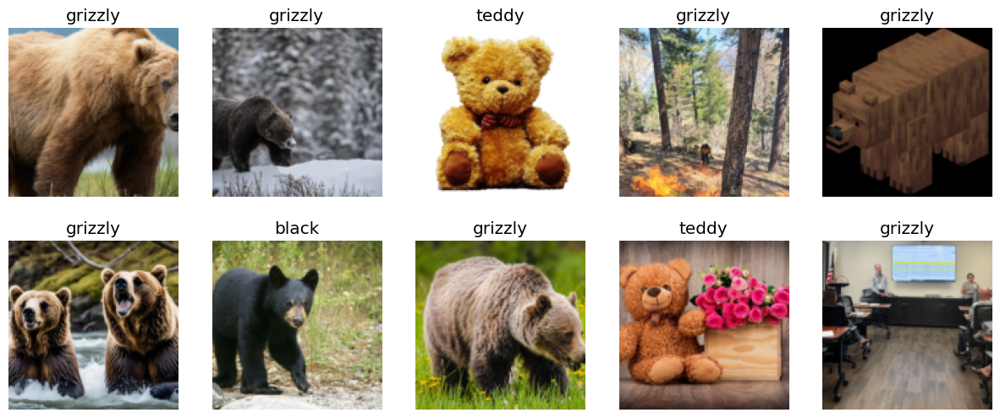

In [ ]:
dls = animals.dataloaders(path)
dls.valid.show_batch(max_n = 10, nrows = 2)

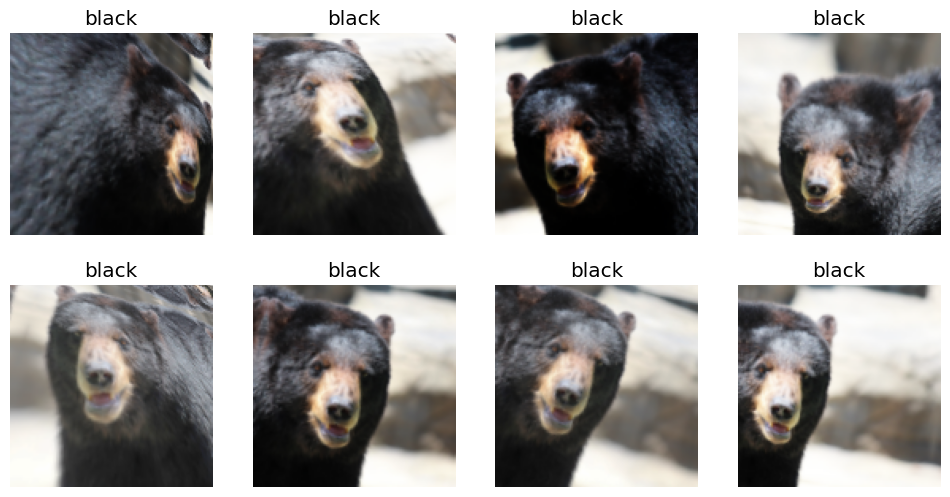

In [ ]:
animals = animals.new(item_tfms = Resize(128), batch_tfms =aug_transforms(mult = 2))
dls = animals.dataloaders(path)
dls.train.show_batch(max_n =8, nrows = 2, unique  = True)

In [ ]:
animals = animals.new(
    item_tfms = RandomResizedCrop(224, min_scale = 0.5),
    batch_tfms = aug_transforms()
)
dls = animals.dataloaders(path)

In [ ]:
learn = vision_learner(dls, resnet50, metrics = error_rate)
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.803030,1.425692,0.740741,00:06


epoch,train_loss,valid_loss,error_rate,time
0,1.954145,1.048096,0.555556,00:05
1,1.514369,0.658488,0.259259,00:06
2,1.130440,0.454700,0.148148,00:05
3,0.931643,0.356500,0.074074,00:05
4,0.795408,0.280465,0.074074,00:07
5,0.676488,0.252063,0.074074,00:05
6,0.580790,0.223101,0.074074,00:06
7,0.505655,0.205869,0.074074,00:05
8,0.450112,0.163056,0.074074,00:06
9,0.415455,0.140385,0.074074,00:06


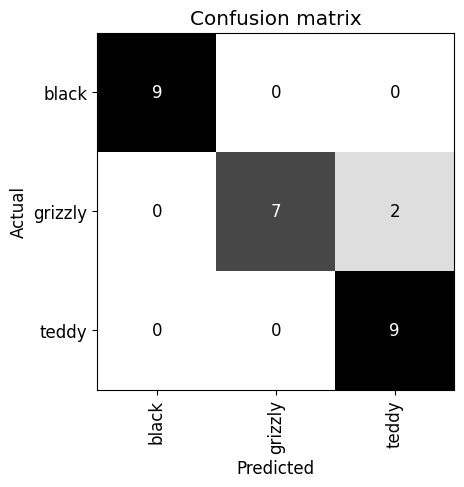

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(cmap='Greys')

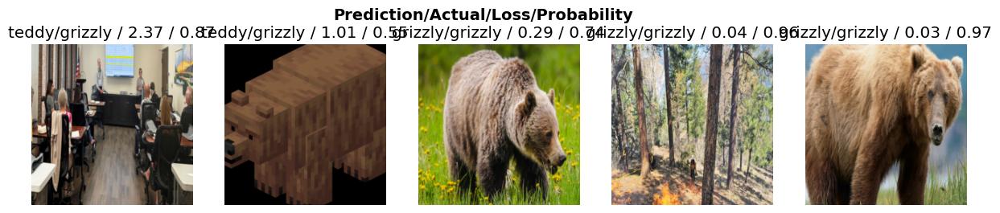

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# to delete (unlink) all images selected for deletion, we would run:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
#To move images for which we've selected a different category, we would run:
for idx, cat in cleaner.change():shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
animals = animals.new(
    item_tfms = RandomResizedCrop(224, min_scale = 0.5),
    batch_tfms = aug_transforms()
)
dls = animals.dataloaders(path)
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(3)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.953423,3.870725,0.666667,00:05


epoch,train_loss,valid_loss,error_rate,time
0,1.965947,2.649779,0.666667,00:06
1,1.871545,0.721775,0.259259,00:05
2,1.490139,0.256591,0.111111,00:05


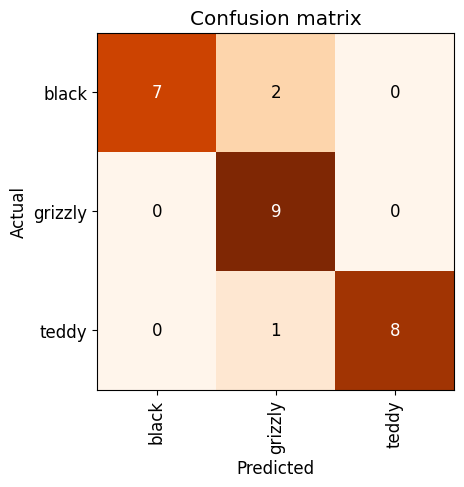

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(cmap='Oranges')

In [ ]:

learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:

learn_inf = load_learner(path/'export.pkl')

In [ ]:

learn_inf.predict('images/bear.jpg')

('grizzly', tensor(1), tensor([0.1204, 0.7039, 0.1758]))

In [ ]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [ ]:
!pip install ipywidgets
!pip install gradio
!pip install huggingface_hub
!pip install voila --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 88.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 13.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.2/318.2 kB 40.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 101.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 33.7

In [ ]:

#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/bear.jpg'])

In [ ]:

img = PILImage.create(btn_upload.data[-1])

In [ ]:

#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [ ]:

pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.7039')

In [ ]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [ ]:
#hide_output
VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])


In [ ]:

#hide
# !pip install voila
# !jupyter serverextension enable --sys-prefix voila

In [ ]:
learn.export('model.pkl')